#Project Setup

Background
Emotion detection enables machines to detect various emotions. The technique that helps machines and computers to be capable of detecting, expressing and understanding emotions is known as emotional intelligence. In this miniproject we will implement naive Bayes from scratch and BERT-based model with
pertained weights through package and finetuning, and compare these algorithms on Emotion dataset. The goal is to gain experience implementing machine learning algorithm from scratch and running the modern deep learning libraries, and getting hands-on experience comparing their performances on the real-world textual dataset.


##Import Necessary Libraries

In [48]:
!pip install datasets
!pip install transformers torch
!pip install accelerate -U
!pip install transformers[torch] accelerate
!pip install bertviz

In [49]:
#Importing the necessary libraries and functions
from transformers import (
    BertTokenizer,
    BertForSequenceClassification,
    AdamW,
    DistilBertTokenizer,
    DistilBertForSequenceClassification,
    pipeline,
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments,
    AutoConfig,
    AutoModel
)

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from torch.utils.data import DataLoader, TensorDataset
from datasets import load_dataset
import matplotlib.pyplot as plt
import seaborn as sn
import pandas as pd
import numpy as np
import torch
import time


# from transformers import BertTokenizer, BertForSequenceClassification, AdamW, DistilBertTokenizer, DistilBertForSequenceClassification
# from sklearn.feature_extraction.text import CountVectorizer
# from torch.utils.data import DataLoader
# from datasets import load_dataset
# import matplotlib.pyplot as plt
# import numpy as np
# import torch


#Setting the GPU:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#Task 1: Preprocess dataset

The Emotion data is downloaded from https://huggingface.co/datasets/dair-ai/emotion. Only data in the “train” category is used for training and the data from the “test” category is used for all performance metrics. We work with the text documents to build our own features.

For the naive Bayes method, we design the data preprocessing pipeline that turns the unstructured text data into numerical features. Specifically, we used the bags of words representation using the scikit-learn function CountVectorizer1.

For BERT, we used the transformers package to tokenize the input text and convert the tokens into numerical features https://pytorch.org/hub/huggingface_pytorch-transformers/.

In [55]:
# Load dataset
dataset = load_dataset("dair-ai/emotion")

# Extract features (text) and labels
train_texts = [example['text'] for example in dataset['train']]
train_labels = [example['label'] for example in dataset['train']]
test_texts = [example['text'] for example in dataset['test']]
test_labels = [example['label'] for example in dataset['test']]

# Vectorize text data
vectorizer = CountVectorizer()
X_train = vectorizer.fit_transform(train_texts)
X_test = vectorizer.transform(test_texts)

# Convert labels to numpy arrays
y_train = np.array(train_labels)
y_test = np.array(test_labels)

Visualize the shape of the training set and the test set

In [56]:
print(X_train.shape)
print(X_test.shape)

(16000, 15186)
(2000, 15186)


In [57]:
def show_class_distribution(labels, title):
  label_dict = {}
  for label in labels:
    if label in label_dict:
      label_dict[label] += 1
    else:
      label_dict[label] = 1

  labels = list(label_dict.keys())
  counts = list(label_dict.values())

  fig = plt.figure(figsize = (10, 5))

  # creating the bar plot
  plt.bar(labels, counts, width = 0.5)

  plt.xlabel("Class Labels")
  plt.ylabel("Number of occurrences in dataset")
  plt.title(title)
  plt.show()

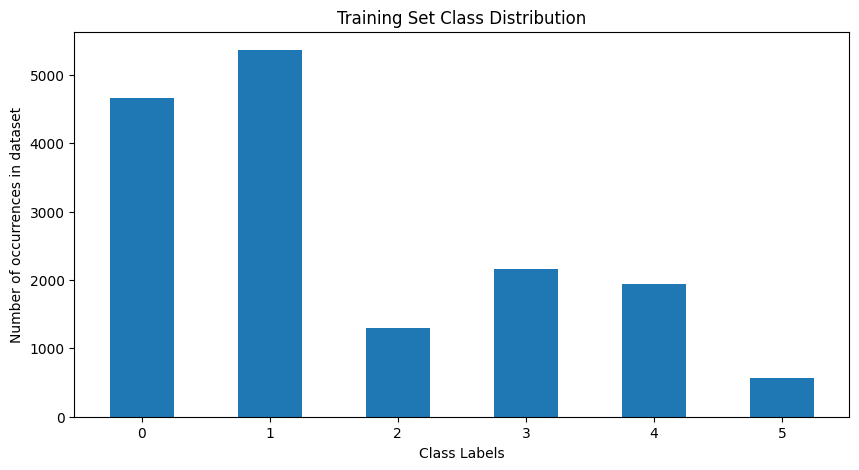

In [58]:
show_class_distribution(train_labels, "Training Set Class Distribution")

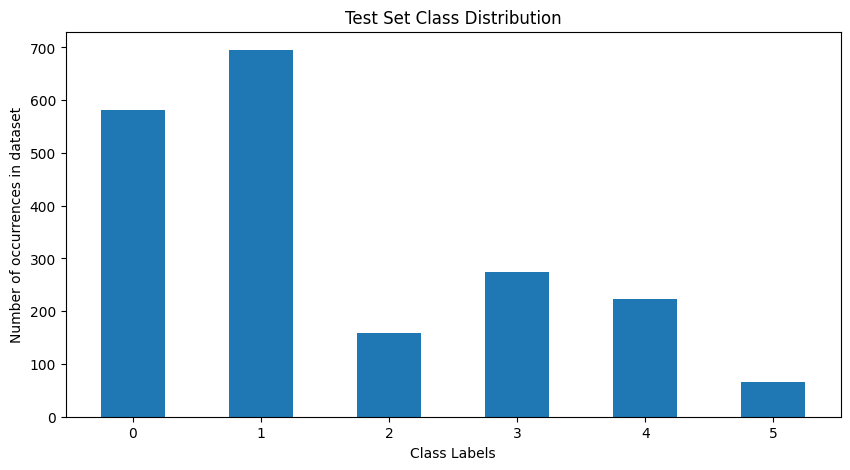

In [59]:
show_class_distribution(test_labels, "Test Set Class Distribution")

#Task 2: Implement Naive Bayes and BERT Models

#Task 2.1: Implementing Naive Bayes Model

Implementation of the Naive Bayes model from scratch using the appropriate type of likelihood for features (i.e., not using Scikit Learn or any other pre-existing implementations of these methods).

In [60]:
class NaiveBayes:
    def __init__(self, alpha=1.0):
        self.alpha = alpha  # Laplace smoothing parameter
        self.class_log_prior = None
        self.feature_log_prob = None
        self.classes = None

    def fit(self, X, y):
        #Fit the Multinomial Naive Bayes classifier.
        #X is a matrix of word counts, and y is the target labels.
        n_samples, n_features = X.shape
        self.classes = np.unique(y)
        n_classes = len(self.classes)

        # Initialize class prior probabilities and feature probabilities
        self.class_log_prior = np.zeros(n_classes, dtype=np.float64)
        self.feature_log_prob = np.zeros((n_classes, n_features), dtype=np.float64)

        # Calculate class log prior probabilities and feature probabilities
        #print(len(self.classes))
        #print(self.classes)
        for idx, c in enumerate(self.classes):
            #print("The x with shape", X.shape, " is ", X) #each value of X is a tupple (documentIndex, feature/word index), occurance of feature/word
            X_c = X[y == c] # contains every (documentIndex, feature/word index), occurance of feature/word    that corresponds to a document with the emotional classification for the iteration
            #print("The x_c is with shape ", X_c.shape, " is ",X_c)
            #print(X_c.shape)
            self.class_log_prior[idx] = np.log(X_c.shape[0] / n_samples) #X_c.shape[0] is the number of documents corresponding to said class... => input to log is the proportion of documents corresponding to class c
            total_count = X_c.sum(axis=0) + self.alpha #alpha for laplace smoothing.... vector such that each element is a sum of feature counts for documents belonging to class c
            #print("the total count is", total_count, "with len = ", len(total_count))
            self.feature_log_prob[idx] = np.log(total_count / total_count.sum()) #log is distributed to each element in vector st vector element is the probability of the feature in c labelled samples

    def predict(self, X):
        #Perform classification on an array of test vectors X.
        return np.argmax(self.predict_log_probability(X), axis=1)

    def predict_log_probability(self, X):
        #Return log-probability estimates for the test vector X.
        return X @ self.feature_log_prob.T + self.class_log_prior

    def evalulate_acc(self, X, y):
        #Returns the mean accuracy on the given test data and labels.
        predictions = self.predict(X)
        return np.mean(predictions == y)


Example of how to use the above model:

In [61]:
nb_classifier = NaiveBayes()
nb_classifier.fit(X_train, y_train)

# Predict labels for the test set
y_pred = nb_classifier.predict(X_test)

Naive_Bayes_pred = y_pred

# Calculate accuracy of training data
y_train_pred = nb_classifier.predict(X_train)
train_accuracy = np.mean(y_train_pred == y_train)
print(f"Model Train Accuracy: {train_accuracy}")

# Calculate accuracy of test data
y_pred = nb_classifier.predict(X_test)
accuracy = np.mean(y_pred == y_test)
print(f"Model Test Accuracy: {accuracy}")

Model Train Accuracy: 0.8760625
Model Test Accuracy: 0.7655


#Task 2.2: Implementing BERT Models

##Loading the datasets

In [62]:
# Load dataset
emotions = load_dataset("emotion")

##Implementing the BERT Base uncased model
Defining the model and checking the test accuracy

In [63]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from datasets import load_dataset
import torch

# Load dataset
dataset = load_dataset("dair-ai/emotion")

# Load pre-trained model and tokenizer
model_name = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name).to(device)

# Tokenize and encode testing data
test_texts = [example['text'] for example in dataset['test']]
test_labels = [example['label'] for example in dataset['test']]
test_inputs = tokenizer(test_texts, padding=True, truncation=True, return_tensors="pt").to(device)

# Perform inference
model.eval()
with torch.no_grad():
    outputs = model(**test_inputs)

# Move logits to CPU for further processing
logits = outputs.logits.cpu()

# Post-process predictions (e.g., get predicted labels)
predicted_labels = torch.argmax(logits, dim=1).numpy()

BERT_pred = predicted_labels

# Move the ground truth labels to CPU
test_labels = torch.tensor(test_labels).cpu().numpy()

# Calculate accuracy
correct_predictions = (predicted_labels == test_labels)
accuracy = correct_predictions.sum() / len(test_labels)

# Print accuracy
print(f"Test accuracy of BERT base uncased model with pre-trained weights: {accuracy}")


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Test accuracy of BERT base uncased model with pre-trained weights: 0.343


##FineTuning the bert base model, all weights
This model was not structurally changed at all, keeps all parameters from bert-base-uncased

In [64]:
model_name = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize(batch):
    return tokenizer(batch["text"], padding=True, truncation=True)

emotions_encoded = emotions.map(tokenize, batched=True, batch_size=None)

num_labels = 6
model = (AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=num_labels).to(device))

#Setting the train model's features appropriately
emotions_encoded.set_format("torch", columns=["input_ids", "attention_mask", "label"])

#Using SKLearn's metric calculations
from sklearn.metrics import accuracy_score, f1_score
#Defining helper function to compute the metrics
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    f1 = f1_score(labels, preds, average="weighted")
    acc = accuracy_score(labels, preds)
    return {"accuracy": acc, "f1": f1}

####Displaying the Config of the Model:
config = AutoConfig.from_pretrained(model_name)
config

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.35.2",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

In [65]:
###### DEFINING TRAINING ARGUMENTS AND TRAINING THE MODEL ######
batch_size = 64
NUM_EPOCHS = 5
logging_steps = len(emotions_encoded["train"]) // batch_size
training_args = TrainingArguments(output_dir="results",
                                  num_train_epochs=NUM_EPOCHS,
                                  learning_rate=2e-5,
                                  per_device_train_batch_size=batch_size,
                                  per_device_eval_batch_size=batch_size,
                                  load_best_model_at_end=True,
                                  metric_for_best_model="accuracy",
                                  weight_decay=0.01,
                                  evaluation_strategy="epoch",
                                  save_strategy="epoch",
                                  disable_tqdm=False)

#Creating Trainer object
trainer = Trainer(model=model, args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=emotions_encoded["train"],
                  eval_dataset=emotions_encoded["validation"])

#Training the Model
trainer.train();

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,No log,0.252241,0.925500,0.926034
2,0.485300,0.175068,0.936500,0.936993
3,0.485300,0.170338,0.935000,0.935308
4,0.110200,0.159827,0.939500,0.939591
5,0.110200,0.154696,0.938500,0.938580


Saving the model and the tokenizer - Must do for attention matrix visualization

In [66]:
model.save_pretrained('./modelAllLayers')
tokenizer.save_pretrained('./modelAllLayers')

('./modelAllLayers/tokenizer_config.json',
 './modelAllLayers/special_tokens_map.json',
 './modelAllLayers/vocab.txt',
 './modelAllLayers/added_tokens.json',
 './modelAllLayers/tokenizer.json')

Displaying the Results of the Training

In [67]:
results = trainer.evaluate()
results

{'eval_loss': 0.15982671082019806,
 'eval_accuracy': 0.9395,
 'eval_f1': 0.9395910094510931,
 'eval_runtime': 7.8474,
 'eval_samples_per_second': 254.862,
 'eval_steps_per_second': 4.078,
 'epoch': 5.0}

Predicting the test dataset

In [68]:
preds_output_12AW = trainer.predict(emotions_encoded["test"])
BERT_12AW_pred = [np.argmax(preds_output_12AW.predictions[i]) for i in range(len(preds_output_12AW.predictions))]
preds_output_12AW.metrics

{'test_loss': 0.16769947111606598,
 'test_accuracy': 0.929,
 'test_f1': 0.9283122490356902,
 'test_runtime': 7.0437,
 'test_samples_per_second': 283.94,
 'test_steps_per_second': 4.543}

##FineTuning the bert base model, Last 4 Layers

In [86]:
from transformers import AdamW, get_linear_schedule_with_warmup
from torch.optim.lr_scheduler import LambdaLR


model_name = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)

emotions_encoded = emotions.map(tokenize, batched=True, batch_size=None)

num_labels = 6
# Load the model configuration
config = AutoConfig.from_pretrained(model_name)

# Load the model with pre-trained weights
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=num_labels).to(device)

# Identify the last 4 layers to train
num_layers_to_train = 4
num_layers_total = config.num_hidden_layers

# Separate parameters for layers to freeze and layers to train
parameters_to_freeze = []
parameters_to_train = []

for name, param in model.named_parameters():
    if f"encoder.layer.{num_layers_total - 1}" in name:
        parameters_to_train.append(param)
    else:
        parameters_to_freeze.append(param)

# Define optimizer and learning rate scheduler
optimizer = AdamW([
    {'params': parameters_to_freeze, 'lr': 0.0},
    {'params': parameters_to_train, 'lr': 5e-5},
], weight_decay=0.01)

batch_size = 64
NUM_EPOCHS = 5
scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=len(trainer.get_train_dataloader()) * NUM_EPOCHS)

logging_steps = len(emotions_encoded["train"]) // batch_size
training_args = TrainingArguments(
    output_dir="results",
    num_train_epochs=NUM_EPOCHS,
    learning_rate=2e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    weight_decay=0.01,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    disable_tqdm=False,
)

# Modify the trainer's optimizer and scheduler
trainer = Trainer(
    model=model,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=emotions_encoded["train"],
    eval_dataset=emotions_encoded["validation"],
)

trainer.optimizer = optimizer
trainer.lr_scheduler = scheduler

# Training the Model
trainer.train()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1
1,No log,0.900084,0.694500,0.659952
2,1.093000,0.738164,0.758000,0.746278
3,1.093000,0.675127,0.781500,0.774610
4,0.742200,0.643324,0.796500,0.791887
5,0.742200,0.634755,0.801000,0.796707


TrainOutput(global_step=1250, training_loss=0.87344716796875, metrics={'train_runtime': 1182.7622, 'train_samples_per_second': 67.638, 'train_steps_per_second': 1.057, 'total_flos': 3576794362560000.0, 'train_loss': 0.87344716796875, 'epoch': 5.0})

Displaying the Results of the Training

In [87]:
results = trainer.evaluate()
results

{'eval_loss': 0.6347549557685852,
 'eval_accuracy': 0.801,
 'eval_f1': 0.7967073616250993,
 'eval_runtime': 8.0423,
 'eval_samples_per_second': 248.684,
 'eval_steps_per_second': 3.979,
 'epoch': 5.0}

Predicting the test dataset

In [88]:
preds_output_12L4 = trainer.predict(emotions_encoded["test"])
BERT_12L4_pred = [np.argmax(preds_output_12L4.predictions[i]) for i in range(len(preds_output_12L4.predictions))]
preds_output_12L4.metrics

{'test_loss': 0.6172933578491211,
 'test_accuracy': 0.8085,
 'test_f1': 0.80408385321066,
 'test_runtime': 7.2236,
 'test_samples_per_second': 276.87,
 'test_steps_per_second': 4.43}

##Changing Model Structure for Additional Experiments
The following structural changes were made:

Increased Dropout rate for the attention layers from 0.1 to 0.12 (Stronger Regularization)

Decreased the number of layers from 12 to 8

Decreased the number of attention heads from 12 to 8

Overall, this decreases the complexity of the model, resulting in smaller training times and size.

We will be using this model as the main benchmark for all other experiments due to its smaller size and quicker training (Approx 40% Quicker Training)

In [69]:
model_name = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize(batch):
    return tokenizer(batch["text"], padding=True, truncation=True)

emotions_encoded = emotions.map(tokenize, batched=True, batch_size=None)

####Changing the Structural configuration of the model:
config = AutoConfig.from_pretrained(model_name)
config.attention_probs_dropout_prob = 0.12
config.num_hidden_layers = 8
config.num_attention_heads = 8
config.num_labels = 6


num_labels = 6
model = (AutoModelForSequenceClassification.from_pretrained(model_name, config=config, ignore_mismatched_sizes=True).to(device))

#Setting the train model's features appropriately
emotions_encoded.set_format("torch", columns=["input_ids", "attention_mask", "label"])

#Using SKLearn's metric calculations
from sklearn.metrics import accuracy_score, f1_score
#Defining helper function to compute the metrics
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    f1 = f1_score(labels, preds, average="weighted")
    acc = accuracy_score(labels, preds)
    return {"accuracy": acc, "f1": f1}


config

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.12,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "id2label": {
    "0": "LABEL_0",
    "1": "LABEL_1",
    "2": "LABEL_2",
    "3": "LABEL_3",
    "4": "LABEL_4",
    "5": "LABEL_5"
  },
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "LABEL_0": 0,
    "LABEL_1": 1,
    "LABEL_2": 2,
    "LABEL_3": 3,
    "LABEL_4": 4,
    "LABEL_5": 5
  },
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 8,
  "num_hidden_layers": 8,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.35.2",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

In [ ]:
###### DEFINING TRAINING ARGUMENTS AND TRAINING THE MODEL ######
batch_size = 64
NUM_EPOCHS = 5
logging_steps = len(emotions_encoded["train"]) // batch_size
training_args = TrainingArguments(output_dir="results",
                                  num_train_epochs=NUM_EPOCHS,
                                  learning_rate=2e-5,
                                  per_device_train_batch_size=batch_size,
                                  per_device_eval_batch_size=batch_size,
                                  load_best_model_at_end=True,
                                  metric_for_best_model="accuracy",
                                  weight_decay=0.01,
                                  evaluation_strategy="epoch",
                                  save_strategy="epoch",
                                  disable_tqdm=False)

#Creating Trainer object
trainer = Trainer(model=model, args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=emotions_encoded["train"],
                  eval_dataset=emotions_encoded["validation"])

#Training the Model
trainer.train();

Epoch,Training Loss,Validation Loss,Accuracy,F1
1,No log,0.264721,0.914000,0.914210
2,0.552400,0.180057,0.925500,0.925774
3,0.552400,0.166630,0.932000,0.932376
4,0.129500,0.158667,0.932000,0.931477
5,0.129500,0.160268,0.929000,0.929025


Saving the model and the tokenizer - Must do for attention matrix visualization

In [ ]:
model.save_pretrained('./modelAllLayers8Heads')
tokenizer.save_pretrained('./modelAllLayers8Heads')

('./modelAllLayers8Heads/tokenizer_config.json',
 './modelAllLayers8Heads/special_tokens_map.json',
 './modelAllLayers8Heads/vocab.txt',
 './modelAllLayers8Heads/added_tokens.json',
 './modelAllLayers8Heads/tokenizer.json')

Displaying the Results of the Training

In [ ]:
results = trainer.evaluate()
results

{'eval_loss': 0.16662979125976562,
 'eval_accuracy': 0.932,
 'eval_f1': 0.9323764928008437,
 'eval_runtime': 5.0914,
 'eval_samples_per_second': 392.821,
 'eval_steps_per_second': 6.285,
 'epoch': 5.0}

Predicting the test dataset

In [38]:
preds_output_8 = trainer.predict(emotions_encoded["test"])
BERT_8_pred = [np.argmax(preds_output_8.predictions[i]) for i in range(len(preds_output_8.predictions))]
preds_output_8.metrics

{'test_loss': 0.1823963075876236,
 'test_accuracy': 0.925,
 'test_f1': 0.925552273676328,
 'test_runtime': 4.5628,
 'test_samples_per_second': 438.332,
 'test_steps_per_second': 7.013}

#Task 3: Run experiments & Results

You will need to conduct the multip-classification experiment on Emotion data and report the performance using accuracy. You are welcome to perform any experiments and analyses you see fit (e.g., to
compare different features), but at a minimum you must complete the following experiments in the order
stated below:

##Overall Comparison of Models

In a single table, compare and report the performance of the Naive Bayes, BERT-based models and your Bert-based model, on the Emotion classification task, and highlight the winner and explain the potential reasons.

### Performance by Class

This section compares the performance of each model by class, examining the accuracy of each model on each class.

In [70]:
def get_accuracy_by_class(y_true, y_pred, model):
  total = 0
  accuracy_dict = {0: [0,0], 1: [0,0], 2: [0,0], 3: [0,0], 4: [0,0], 5: [0,0]}
  for i in range(len(y_pred)):
    y = y_true[i]
    yh = y_pred[i]

    accuracy_dict[y][1] += 1

    if yh == y:
      accuracy_dict[y][0] += 1
      total += 1

  label_mapping = {
    0: 'sadness',
    1: 'joy',
    2: 'love',
    3: 'anger',
    4: 'fear',
    5: 'surprised'
  }

  y_true = [label_mapping[number] for number in y_true]
  y_pred = [label_mapping[number] for number in y_pred]

  labels = ["sadness", "joy", "love", "anger", "fear", "surprised"]

  accuracies = [accuracy_dict[label][0] / accuracy_dict[label][1] for label in accuracy_dict]

  fig = plt.figure(figsize = (10, 5))
  plt.bar(labels, accuracies, width = 0.5)
  plt.xlabel("Class Labels")
  plt.ylabel("Accuracy")
  plt.title(model + " Accuracy by Class")
  plt.show()

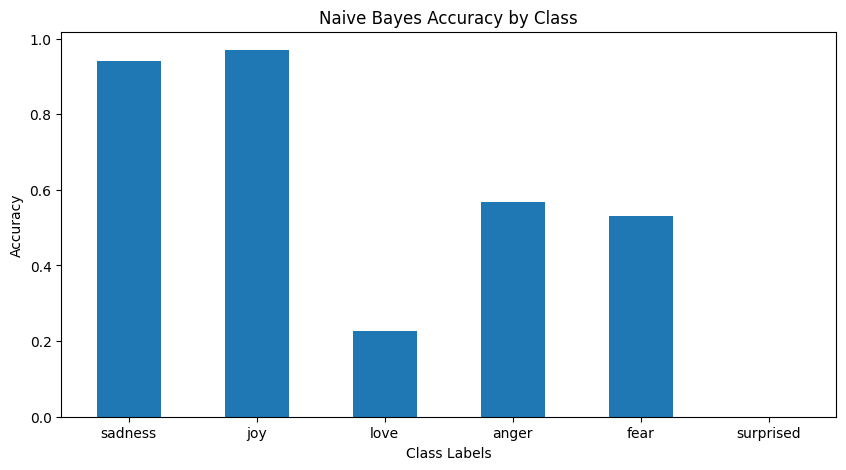

In [71]:
get_accuracy_by_class(y_test, Naive_Bayes_pred, "Naive Bayes")

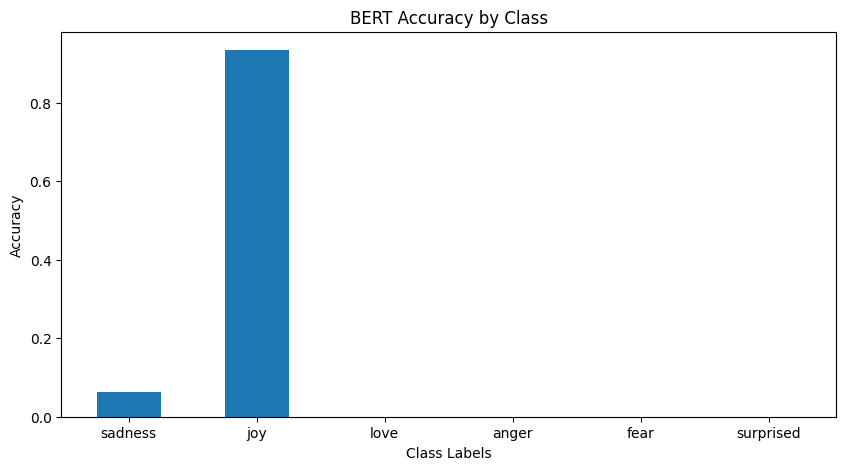

In [73]:
get_accuracy_by_class(y_test, BERT_pred, "BERT")

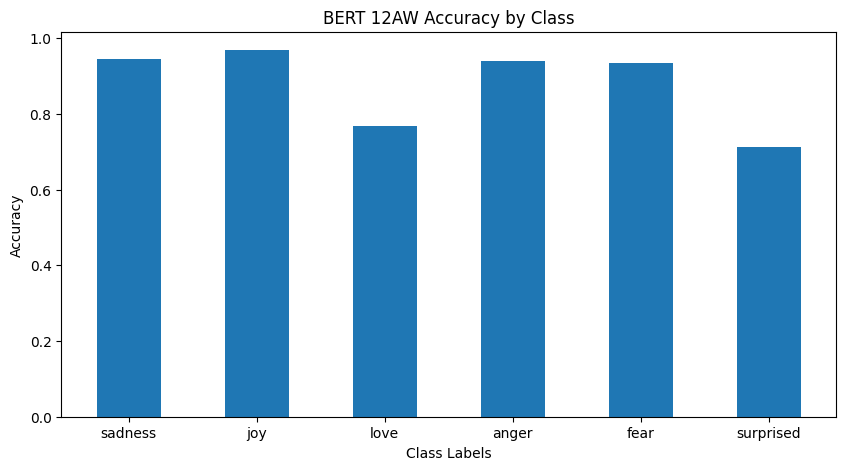

In [74]:
get_accuracy_by_class(y_test, BERT_12AW_pred, "BERT 12AW")

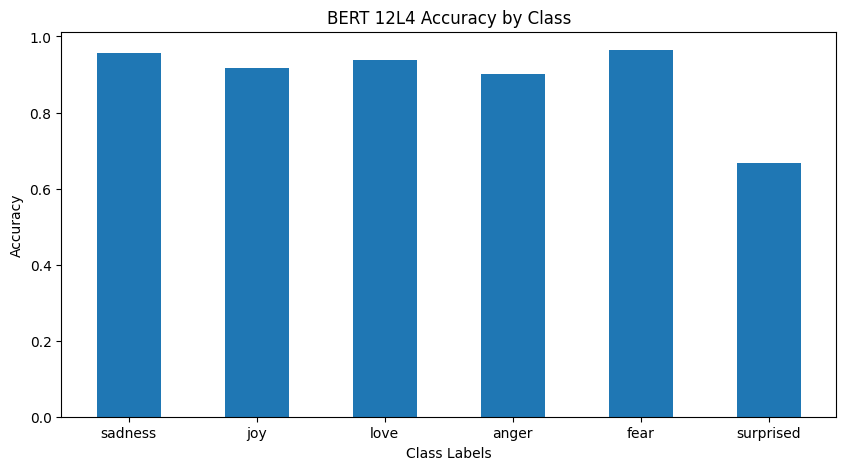

In [75]:
get_accuracy_by_class(y_test, BERT_12L4_pred, "BERT 12L4")

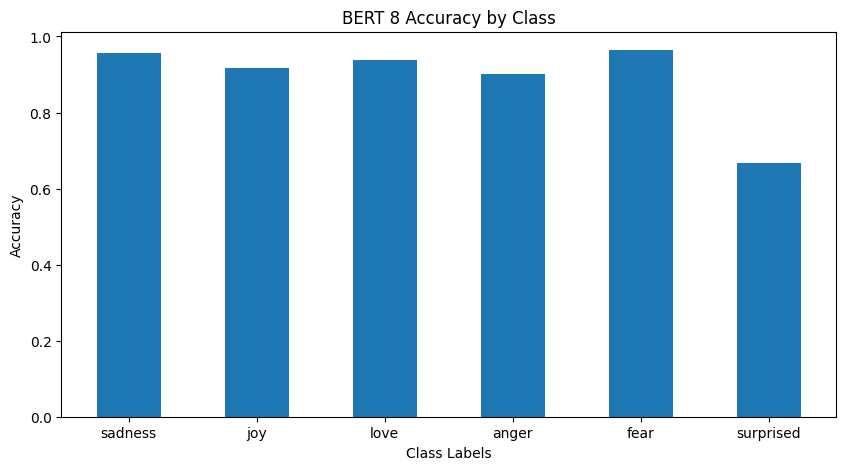

In [76]:
get_accuracy_by_class(y_test, BERT_8_pred, "BERT 8")

### Confusion Matrix Visualization

In [77]:
def create_confusion_matrix(y_true, y_pred, model):
  label_mapping = {
    0: 'sadness',
    1: 'joy',
    2: 'love',
    3: 'anger',
    4: 'fear',
    5: 'surprised'
  }

  y_true = [label_mapping[number] for number in y_true]
  y_pred = [label_mapping[number] for number in y_pred]

  labels = ["sadness", "joy", "love", "anger", "fear", "surprised"]
  cm = confusion_matrix(y_true, y_pred, labels=labels)
  df_cm = pd.DataFrame(cm, labels, labels)
  ax = sn.heatmap(df_cm, annot=True, square=True, fmt='g')
  ax.set_ylim(0, 6)
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix for " + model + " Model")
  ax.invert_yaxis()
  plt.show()

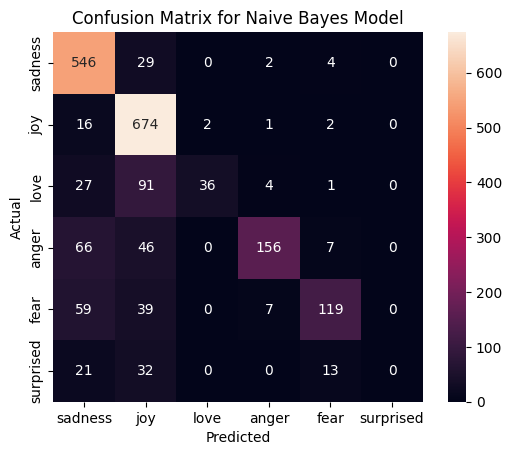

In [78]:
create_confusion_matrix(y_test, Naive_Bayes_pred, "Naive Bayes")

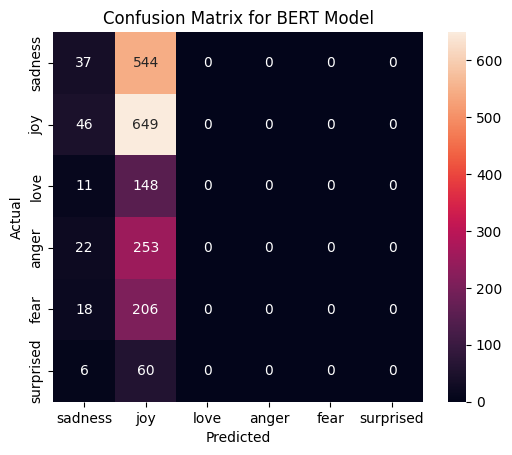

In [79]:
create_confusion_matrix(y_test, BERT_pred, "BERT")

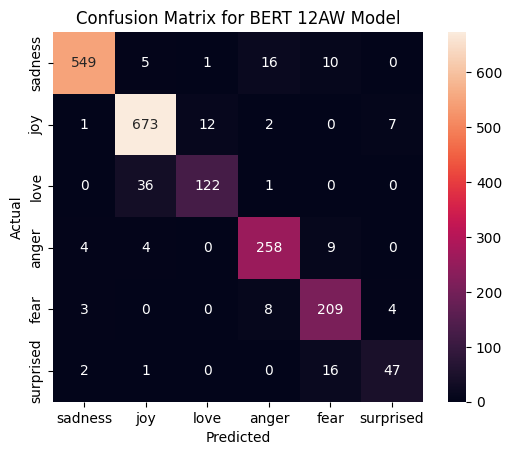

In [80]:
create_confusion_matrix(y_test, BERT_12AW_pred, "BERT 12AW")

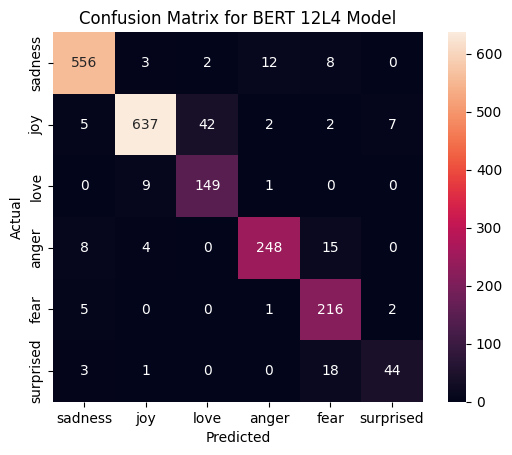

In [81]:
create_confusion_matrix(y_test, BERT_12L4_pred, "BERT 12L4")

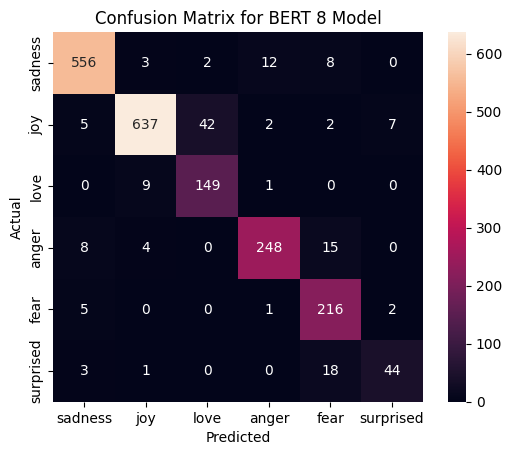

In [82]:
create_confusion_matrix(y_test, BERT_8_pred, "BERT 8")

##Attention Matrix Analysis

In [83]:
import numpy as np
import random
from transformers import AutoTokenizer

# Step 1: Obtain Predictions and Actual Labels
predicted_labels = preds_output_8.predictions  # or the appropriate attribute

# Assuming you have the same tokenizer as used for the initial tokenization
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

# Function to convert tokenized input to sentence
def convert_to_sentence(encoded_input):
    return tokenizer.decode(encoded_input['input_ids'], skip_special_tokens=True)

# Convert predicted scores to class labels
predicted_class_labels = np.argmax(predicted_labels, axis=1)

# Compare Predictions with Actual Labels and separate correctly and incorrectly classified indices
correct_indices = []
incorrect_indices = []

for i, (predicted, actual) in enumerate(zip(predicted_class_labels, test_labels)):
    if predicted == actual:
        correct_indices.append(i)
    else:
        incorrect_indices.append(i)

# Retrieve Correctly Classified Documents as Sentences
correctly_classified_sentences = [convert_to_sentence(emotions_encoded["test"][i]) for i in correct_indices]

# Retrieve Incorrectly Classified Documents as Sentences
incorrectly_classified_sentences = [convert_to_sentence(emotions_encoded["test"][i]) for i in incorrect_indices]

# Ensure sample_size is not larger than the number of correctly/incorrectly classified documents
sample_size_correct = min(10, len(correctly_classified_sentences))
sample_size_incorrect = min(10, len(incorrectly_classified_sentences))

# Sample from Correctly and Incorrectly Classified Documents
sampled_correct_sentences = random.sample(correctly_classified_sentences, sample_size_correct) if correctly_classified_sentences else []
sampled_incorrect_sentences = random.sample(incorrectly_classified_sentences, sample_size_incorrect) if incorrectly_classified_sentences else []

print(len(sampled_correct_sentences), "Sampled Correctly Classified Sentences:", sampled_correct_sentences)
print(len(sampled_incorrect_sentences), "Sampled Incorrectly Classified Sentences:", sampled_incorrect_sentences)






10 Sampled Correctly Classified Sentences: ['im feeling fab thank you so very much for asking', 'i see you on the pitchers mound at our little league diamond i feel so anxious for you because it looks so isolated over there', 'i can t stop the anxiety i feel when i m alone when i ve got no distractions', 'i am not feeling the love towards myself and that becomes somewhat of a vicious circle resulting in me just feeling lazy complacent and in general just de motivated', 'i couldnt help feeling for him and this awful predicament he lives with on a daily and nightly basis and i was just so glad that once bel started to see the light he stuck it out and stood by daniel whilst no one else did including his family who im afraid i got really disgusted with', 'i feel a bit dull by it all', 'i hostage negotiator on her case has her feeling hopeful about her future', 'i was so impressed with the show especially for hs and i was moved by these talented kids but then again i feel very passionate a

## Visualizing the Attention weights

In [84]:
from bertviz import model_view

# Loading the saved model -> Must run the Fine-tuning on all layers before running this
model_path = './modelAllLayers8Heads'
model = BertForSequenceClassification.from_pretrained(model_path, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_path)

# Example text
#example_text = "i journaled about my tendency to sometimes overcommit myself which can make me feel exhausted and overwhelmed"
for example_text in sampled_correct_sentences[:3]:
  # Tokenize and prepare the input
  inputs = tokenizer(example_text, return_tensors="pt")
  input_ids = inputs["input_ids"]

  # Run the model to get attention data
  model.eval()
  with torch.no_grad():
      outputs = model(**inputs)

  # Extract attention weights
  attention = outputs.attentions

  # Convert input IDs to tokens
  tokens = tokenizer.convert_ids_to_tokens(input_ids[0])

  print(example_text)
  # Visualize attention
  # Note: BertViz expects a list of tokens (not a tensor) and raw attention weights
  model_view(attention, tokens)



im feeling fab thank you so very much for asking


<IPython.core.display.Javascript object>

i see you on the pitchers mound at our little league diamond i feel so anxious for you because it looks so isolated over there


<IPython.core.display.Javascript object>

i can t stop the anxiety i feel when i m alone when i ve got no distractions


<IPython.core.display.Javascript object>

In [85]:
for example_text in sampled_incorrect_sentences[:3]:
  # Tokenize and prepare the input
  inputs = tokenizer(example_text, return_tensors="pt")
  input_ids = inputs["input_ids"]

  # Run the model to get attention data
  model.eval()
  with torch.no_grad():
      outputs = model(**inputs)

  # Extract attention weights
  attention = outputs.attentions

  # Convert input IDs to tokens
  tokens = tokenizer.convert_ids_to_tokens(input_ids[0])

  # Visualize attention
  # Note: BertViz expects a list of tokens (not a tensor) and raw attention weights
  model_view(attention, tokens)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Examine the attention matrix between the words and the class tokens for some of the correctly and incorrectly predicted documents. You will need to choose one of transformer blocks and use a specific attention head for the multi-layer multi-headed transformer architecture. You are free to do more experiments to your choosing.